In [1]:
import pandas as pd
from umap import UMAP
from ivis import Ivis
import numpy as np
from gensim.models.doc2vec import Doc2Vec
from gensim.utils import simple_preprocess
from hdbscan import HDBSCAN
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm

tqdm.pandas(desc="progess: ")

In [2]:
def sample_data(df, fraction, contamination, seed):
    X_n = int(df[df.outlier_label == 1].shape[0] * fraction)
    y_n = int(X_n * contamination)

    df = df.iloc[np.random.RandomState(seed=seed).permutation(len(df))]
    df = df[df["outlier_label"] == 1].head(X_n).append(
        df[df["outlier_label"] == -1].head(y_n))
    df = df.reset_index(drop=True)
    return df

def reject_outliers(sr, iq_range=0.5):
        pcnt = (1 - iq_range) / 2
        qlow, median, qhigh = np.quantile(sr, [pcnt, 0.50, 1-pcnt])
        iqr = qhigh - qlow
        return ((np.abs(sr - median)) >= iqr/2)

In [3]:
umap_2d = UMAP(metric="cosine", set_op_mix_ratio=1.0,
               n_components=2, random_state=42)

In [4]:
def load_and_add_col(name_and_path):
    name, path = name_and_path
    df = pd.read_csv(path, sep="\t")
    df["name"] = name
    return df

In [5]:
# parameters
data_path = "/home/philipp/projects/dad4td/data/processed/oe_data.pkl"
doc2vec_model_path = "/home/philipp/projects/dad4td/models/apnews_dbow/doc2vec.bin"
doc2vec_model = Doc2Vec.load(doc2vec_model_path)


# get test data
#df = pd.concat([load_and_add_col(x) for x in filelist])
df_w = pd.read_csv("/home/philipp/projects/dad4td/data/processed/wiki_2m_sf.txt", sep="\n", header=None)
df_w.columns = ["text"]
df_w["title"], df_w["outlier_label"] = "wiki", 1.0
df_w

,text,title,outlier_label
0,"joanna heights, pennsylvania joanna heights is...",wiki,1.0
1,list of chairmen of the national labor relati...,wiki,1.0
2,richard spooner mp richard spooner 28 july 17...,wiki,1.0
3,just go with it just go with it is a 2011 ame...,wiki,1.0
4,ciara disambiguation ciara is an american sin...,wiki,1.0
...,...,...,...
916145,google maori google mori is a maoriled initia...,wiki,1.0
916146,fresno missionary baptist institute and semin...,wiki,1.0
916147,nehemiah ben hushiel nehemiah ben hushiel is ...,wiki,1.0
916148,jamaica chamber of commerce building jamaica ...,wiki,1.0


In [6]:
df_a = pd.read_csv("/home/philipp/projects/dad4td/data/raw/amazon.csv", header=None)
df_a["title"], df_a["outlier_label"] = "amazon", -1.0
df_a.columns = ["index", "header","text", "title", "outlier_label"]
df_a

,index,header,text,title,outlier_label
0,1,mens ultrasheer,"This model may be ok for sedentary types, but ...",amazon,-1.0
1,4,Surprisingly delightful,This is a fast read filled with unexpected hum...,amazon,-1.0
2,2,"Works, but not as advertised",I bought one of these chargers..the instructio...,amazon,-1.0
3,2,Oh dear,I was excited to find a book ostensibly about ...,amazon,-1.0
4,2,Incorrect disc!,"I am a big JVC fan, but I do not like this mod...",amazon,-1.0
...,...,...,...,...,...
649995,5,Pretty Cool!,We got it for our mom's birthday. She LOVES it...,amazon,-1.0
649996,5,great cd,"this cd is very good. i especially love ""cats ...",amazon,-1.0
649997,2,An interesting look into Boston's comedy clubs,This was a good documentary on the history of ...,amazon,-1.0
649998,5,Du vol...pour les cowboys!,Avez-vous déjà vu un CD double et un DVD avec ...,amazon,-1.0


In [7]:
df = pd.concat([df_w, df_a])
df = df[["text", "title", "outlier_label"]]
df = df.where(df.text.map(len) > 5)
df = sample_data(df, fraction=0.05, contamination=0.1, seed=1)
df

,text,title,outlier_label
0,"devil mountain run, 5k, 10k the devil mountai...",wiki,1.0
1,physical security information management phys...,wiki,1.0
2,midhimalayan watershed development project th...,wiki,1.0
3,craig moller craig moller born 22 august 1994...,wiki,1.0
4,"vince valholla vince eyma, otherwise known as...",wiki,1.0
...,...,...,...
50378,The other customers are WAY too kind in their ...,amazon,-1.0
50379,This antenna has allowed us to get rid of Dire...,amazon,-1.0
50380,I love the Sims and bought the holiday add on ...,amazon,-1.0
50381,"Great single, ordinary album. Going solo after...",amazon,-1.0


In [8]:
df.title.value_counts()

wiki      45803
amazon     4580
Name: title, dtype: int64

In [10]:
# ivis
ivis_reducer = Ivis(embedding_dims=1, k=5, n_epochs_without_progress=5, model="maaten", distance="pn")

In [11]:
# get doc2vec vectors
X = df.text
X = X.progress_apply(lambda x: simple_preprocess(x))
docvecs = X.progress_apply(lambda x: doc2vec_model.infer_vector(x))
docvecs = list(docvecs)
docvecs

progess: 100%|██████████| 50383/50383 [06:50<00:00, 122.77it/s]


[array([ 6.97911620e-01,  4.03473347e-01,  2.28736803e-01,  2.26866201e-01,
         2.99947053e-01, -1.20347999e-01, -4.75799382e-01, -6.86767772e-02,
        -4.07804847e-02, -3.96682203e-01,  1.22703023e-01, -3.36888164e-01,
        -1.60967708e-01,  2.58582205e-01, -4.56941694e-01,  2.10380420e-01,
        -3.15357625e-01,  6.18015707e-01, -6.58585608e-01,  5.13492934e-02,
        -1.94457442e-01, -1.94606110e-01,  4.06839788e-01, -3.38407457e-02,
        -5.26703745e-02,  1.86686903e-01, -2.78400093e-01, -7.51540288e-02,
        -2.72428304e-01, -2.57223278e-01,  1.42601337e-02,  8.89234662e-01,
        -1.56114295e-01, -3.50585222e-01, -1.99810162e-01,  4.28690761e-03,
         2.18524948e-01,  4.93946858e-02,  1.71640664e-01,  1.37717212e-02,
         2.72550564e-02,  7.46121764e-01,  2.83629566e-01, -1.85376763e-01,
         1.98073015e-01, -7.89341092e-01, -1.31879561e-02, -2.94115126e-01,
         6.37296513e-02,  3.65721405e-01,  3.41906920e-02, -1.97313219e-01,
         1.2

In [39]:
dim_reducer = UMAP(metric="cosine", set_op_mix_ratio=1.0,
               n_components=20, random_state=42)

# UMAP reduction
dim_reduced_vecs = dim_reducer.fit_transform(docvecs)

In [13]:
scores = ivis_reducer.fit_transform(dim_reduced_vecs)

 12%|█▏        | 6280/50383 [00:00<00:01, 31255.48it/s]

Building KNN index


100%|██████████| 50383/50383 [00:01<00:00, 32234.69it/s]


Extracting KNN from index


100%|██████████| 50383/50383 [00:02<00:00, 17773.12it/s]


Training neural network
Epoch 1/1000
394/394 [==============================] - 13s 32ms/step - loss: 1.2511
Epoch 2/1000
394/394 [==============================] - 13s 32ms/step - loss: 1.4008
Epoch 3/1000
394/394 [==============================] - 12s 31ms/step - loss: 0.3161
Epoch 4/1000
394/394 [==============================] - 12s 31ms/step - loss: 0.0400
Epoch 5/1000
394/394 [==============================] - 12s 32ms/step - loss: 0.0000e+00
Epoch 6/1000
394/394 [==============================] - 17s 43ms/step - loss: 0.0000e+00
Epoch 7/1000
394/394 [==============================] - 15s 39ms/step - loss: 3.7711
Epoch 8/1000
394/394 [==============================] - 13s 32ms/step - loss: 3.2063
Epoch 9/1000
394/394 [==============================] - 14s 36ms/step - loss: 2.9318
Epoch 10/1000
1575/1575 [==============================] - 5s 3ms/step


In [14]:
df["ivis_scores"] = scores

In [15]:
contamination = 0.1
preds = reject_outliers(scores, iq_range=1.0-contamination)
df["pred"] = preds
df["Prediction"] = df.pred + df.outlier_label
df = df.replace({"Prediction":{-1.0:"False Inlier",0.0:"True Outlier",1.0:"True Inlier",2.0:"False Outlier"}})

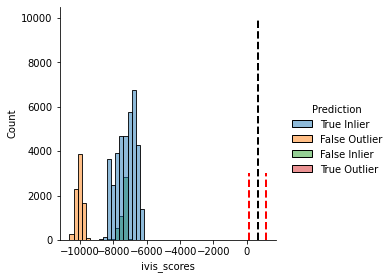

In [16]:
df["Label"] = df.outlier_label.map(lambda x: {-1.0:"outlier", 1.0:"inlier"}[x])
sns.displot(data=df,x="ivis_scores", hue="Prediction", palette="tab10", height=4, bins=25)
plt.plot([145.75, 145.75], [0, 3000], color="red", linestyle='dashed', linewidth=2)
plt.plot([1157.28, 1157.28], [0, 3000], color="red", linestyle='dashed', linewidth=2)
plt.plot([651, 651], [0, 10000], color="black", linestyle='dashed', linewidth=2)
plt.savefig("/home/philipp/projects/dad4td/thesis/pictures/wiki_amazon_hist-apnews-ivis.svg", format="svg")

In [17]:
sr = scores
pcnt = (1 - 0.9) / 2
qlow, median, qhigh = np.quantile(sr, [pcnt, 0.50, 1-pcnt])
print(qlow, median, qhigh)
iqr = qhigh - qlow
print(iqr)
# x - median >= iqr/2
# x - 650 >= 505
print(median+iqr/2, median-iqr/2)

-10134.41015625 -7369.59423828125 -6461.709765625
3672.700390625
-5533.24404296875 -9205.94443359375


In [18]:
vecs_2d = umap_2d.fit_transform(docvecs)

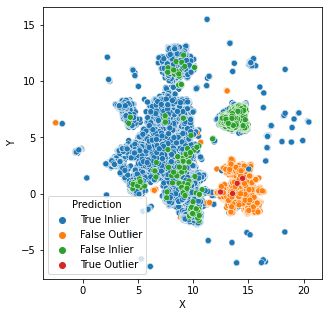

In [19]:
size = 5
plt.figure(figsize=(size,size))
df["X"] = vecs_2d[:, 0]
df["Y"] = vecs_2d[:, 1]
df["pred"] = preds
df["vis_label"] = df.pred + df.outlier_label
df = df.replace({"vis_label":{-1.0:"False Inlier",0.0:"True Outlier",1.0:"True Inlier",2.0:"False Outlier"}})
sns.scatterplot(data=df, x="X", y="Y", hue="Prediction", palette="tab10")
plt.savefig("/home/philipp/projects/dad4td/thesis/pictures/wiki_amazon2d-apnews-ivis.svg", format="svg")

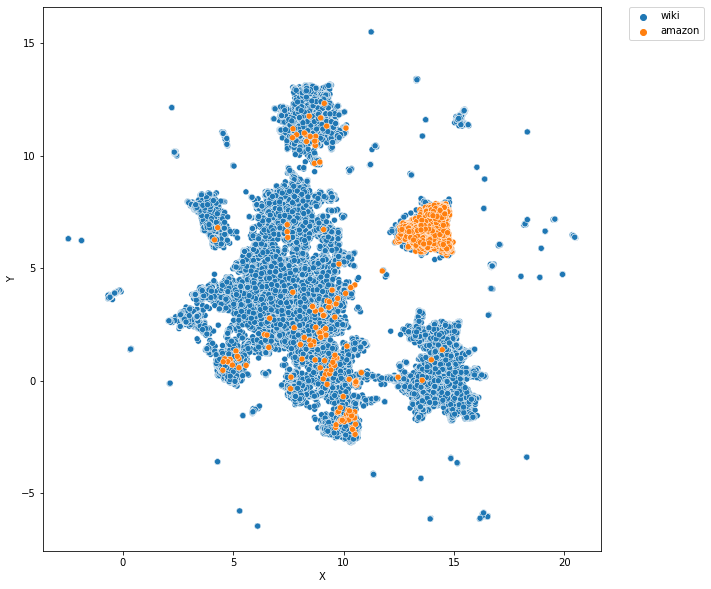

In [20]:
plt.figure(figsize=(10,10))
sns.scatterplot(data=df, x="X", y="Y", hue="title", palette="tab10")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("/home/philipp/projects/dad4td/thesis/pictures/wiki_amazon2d-apnews-title.svg", format="svg")

## HDBSCAN

In [157]:
cluster_model = HDBSCAN(min_cluster_size=35)
cluster_pred = cluster_model.fit_predict(dim_reduced_vecs)

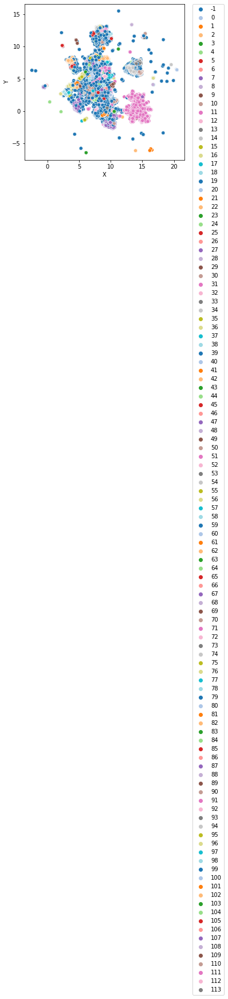

In [158]:
import seaborn as sb
size = 5
plt.figure(figsize=(size,size))
df["cluster"] = cluster_pred
clrs = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075',]
clrs.reverse()
cmap = sb.blend_palette(clrs, 115)
g = sns.scatterplot(data=df, x="X", y="Y", hue="cluster", palette="tab20")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#plt.legend('',frameon=False)
#plt.savefig("/home/philipp/projects/dad4td/thesis/pictures/wiki_amazon2d-apnews-hdbscan.svg", format="svg")

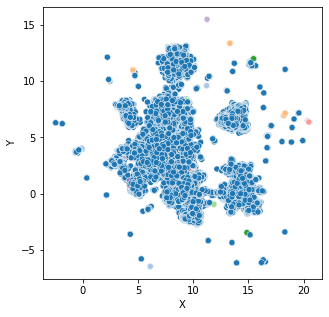

In [156]:
cluster_model = HDBSCAN(min_cluster_size=35)
cluster_pred = cluster_model.fit_predict(docvecs)

size = 5
plt.figure(figsize=(size,size))
df["cluster"] = cluster_pred
g = sns.scatterplot(data=df, x="X", y="Y", hue="cluster", palette="tab20")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.legend('',frameon=False)
#plt.savefig("/home/philipp/projects/dad4td/thesis/pictures/wiki_amazon2d-apnews-hdbscan.svg", format="svg")

In [88]:
from sklearn.metrics import f1_score
a = reject_outliers(scores, iq_range=0.9)
a = [-1 if x else 1 for x in a]
f1_score(df.outlier_label, a, average='macro')

0.47619196140810516

In [160]:
from collections import Counter
bin_cluster = [-1 if x in [50, 53, 54] else 1 for x in cluster_pred]
f1_score(df.outlier_label, bin_cluster, average='macro')
#dict(Counter(bin_cluster).items())

0.8988882403339853

In [79]:
from sklearn.metrics import v_measure_score

v_measure_score(df.outlier_label, cluster_pred)

0.1165876531767003

In [80]:
import plotly.express as px
fig = px.scatter(data_frame=df, x="X", y="Y")
fig.show()


In [82]:
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(y=[2, 1, 4, 3]))
fig.add_trace(go.Bar(y=[1, 4, 3, 2]))
fig.update_layout(title = 'Hello Figure')
fig.show()


## t-SNE

In [135]:
from sklearn.manifold import TSNE

tsnre_reduced = TSNE().fit_transform(docvecs)

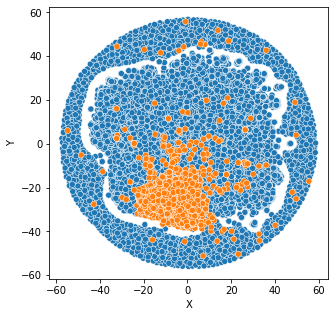

In [136]:
size = 5
plt.figure(figsize=(size,size))
df["Xt"] = tsnre_reduced[:, 0]
df["Yt"] = tsnre_reduced[:, 1]
sns.scatterplot(data=df, x="Xt", y="Yt", hue="title", palette="tab10")
plt.legend('',frameon=False)
plt.xlabel("X")
plt.ylabel("Y")
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("/home/philipp/projects/dad4td/thesis/pictures/wiki_amazonapnews-tsne.svg", format="svg")

## kMeans

In [137]:
from sklearn.cluster import KMeans

kcluster_pred = KMeans(n_clusters=6).fit_predict(dim_reduced_vecs)

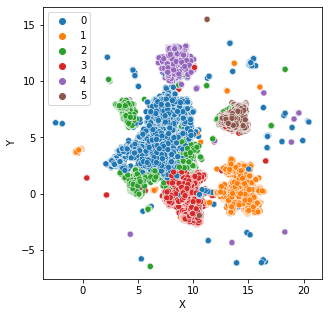

In [138]:
size = 5
plt.figure(figsize=(size,size))
df["kcluster"] = kcluster_pred
sns.scatterplot(data=df, x="X", y="Y", hue="kcluster", palette="tab10")
L=plt.legend()
L.get_texts()[0].set_text('0')
plt.savefig("/home/philipp/projects/dad4td/thesis/pictures/wiki_amazon2d-apnews-kmeans.svg", format="svg")

In [149]:
from sklearn.metrics import f1_score
bin_cluster = [-1 if x==5 else 1 for x in kcluster_pred]
f1_score(df.outlier_label, bin_cluster, average='macro')

0.9623708429854736

## PCA

In [140]:
from sklearn.decomposition import PCA

#pca_reduced = PCA(n_components=256).fit_transform(docvecs)

In [141]:
pca_2d = PCA(n_components=2).fit_transform(docvecs)

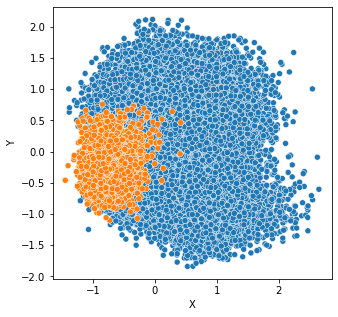

In [142]:
size = 5
plt.figure(figsize=(size,size))
df["Xp"] = pca_2d[:, 0]
df["Yp"] = pca_2d[:, 1]
sns.scatterplot(data=df, x="Xp", y="Yp", hue="title", palette="tab10")
plt.legend('',frameon=False)
plt.xlabel("X")
plt.ylabel("Y")
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("/home/philipp/projects/dad4td/thesis/pictures/wiki_amazonapnews-pca.svg", format="svg")

In [143]:
pca_reduced = PCA(n_components=20).fit_transform(docvecs)

In [144]:
cluster_model = HDBSCAN(min_cluster_size=50)
cluster_pred = cluster_model.fit_predict(pca_reduced)

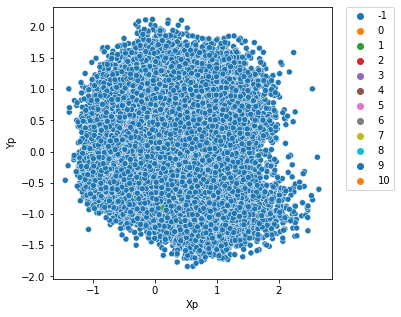

In [145]:
size = 5
plt.figure(figsize=(size,size))
df["cluster"] = cluster_pred
sns.scatterplot(data=df, x="Xp", y="Yp", hue="cluster", palette="tab10")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [146]:
bin_cluster = [-1 if x==1 else 1 for x in cluster_pred]
f1_score(df.outlier_label, bin_cluster, average='macro')

0.4756686439796025

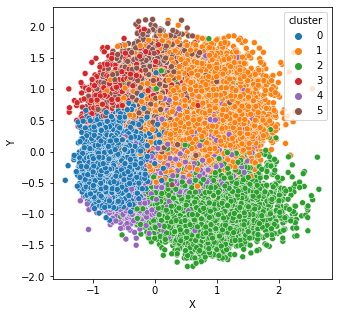

In [155]:
cluster_pred = KMeans(n_clusters=6).fit_predict(dim_reduced_vecs)

size = 5
plt.figure(figsize=(size,size))
df["Xp"] = pca_2d[:, 0]
df["Yp"] = pca_2d[:, 1]
df["cluster"] = cluster_pred
sns.scatterplot(data=df, x="Xp", y="Yp", hue="cluster", palette="tab10")
#plt.legend('',frameon=False)
plt.xlabel("X")
plt.ylabel("Y")
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig("/home/philipp/projects/dad4td/thesis/pictures/wiki_amazonapnews-pca-kmeans.svg", format="svg")

In [154]:
bin_cluster = [-1 if x==4 else 1 for x in cluster_pred]
f1_score(df.outlier_label, bin_cluster, average='macro')

0.9623708429854736